In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from matplotlib import pyplot
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import seaborn as sns
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestClassifier  # For classification
from sklearn.ensemble import RandomForestRegressor  # For regression
from sklearn.metrics import accuracy_score 

In [9]:
df = pd.read_csv("Spotify_Dataset_V3.csv", delimiter = ";")
df.head(10)

,Rank,Title,Artists,Date,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,Valence,# of Artist,Artist (Ind.),# of Nationality,Nationality,Continent,Points (Total),Points (Ind for each Artist/Nat),id,Song URL
0,1,Ella Baila Sola,"Eslabon Armado, Peso Pluma",29/05/2023,0.668,0.758,-5176.0,0.033,0.483,0.000,0.834,Artist 1,Eslabon Armado,Nationality 1,Mexico,Latin-America,200,100.0,3qQbCzHBycnDpGskqOWY0E,https://open.spotify.com/track/3qQbCzHBycnDpGs...
1,1,Ella Baila Sola,"Eslabon Armado, Peso Pluma",29/05/2023,0.668,0.758,-5176.0,0.033,0.483,0.000,0.834,Artist 2,Peso Pluma,Nationality 2,Mexico,Latin-America,200,100.0,3qQbCzHBycnDpGskqOWY0E,https://open.spotify.com/track/3qQbCzHBycnDpGs...
2,2,WHERE SHE GOES,Bad Bunny,29/05/2023,0.652,0.800,-4019.0,0.061,0.143,0.629,0.234,Artist 1,Bad Bunny,Nationality 1,Puerto Rico,Latin-America,199,199.0,7ro0hRteUMfnOioTFI5TG1,https://open.spotify.com/track/7ro0hRteUMfnOio...
3,3,La Bebe - Remix,"Yng Lvcas, Peso Pluma",29/05/2023,0.812,0.479,-5678.0,0.333,0.213,0.000,0.559,Artist 1,Yng Lvcas,Nationality 1,Mexico,Latin-America,198,99.0,2UW7JaomAMuX9pZrjVpHAU,https://open.spotify.com/track/2UW7JaomAMuX9pZ...
4,3,La Bebe - Remix,"Yng Lvcas, Peso Pluma",29/05/2023,0.812,0.479,-5678.0,0.333,0.213,0.000,0.559,Artist 2,Peso Pluma,Nationality 2,Mexico,Latin-America,198,99.0,2UW7JaomAMuX9pZrjVpHAU,https://open.spotify.com/track/2UW7JaomAMuX9pZ...
5,4,Cupid - Twin Ver.,FIFTY FIFTY,29/05/2023,0.783,0.592,-8332.0,0.033,0.435,0.000,0.726,Artist 1,FIFTY FIFTY,Nationality 1,South Korea,Asia,197,197.0,7FbrGaHYVDmfr7KoLIZnQ7,https://open.spotify.com/track/7FbrGaHYVDmfr7K...
6,5,un x100to,"Grupo Frontera, Bad Bunny",29/05/2023,0.569,0.724,-4076.0,0.047,0.228,0.000,0.562,Artist 1,Grupo Frontera,Nationality 1,Mexico,Latin-America,196,98.0,6pD0ufEQq0xdHSsRbg9LBK,https://open.spotify.com/track/6pD0ufEQq0xdHSs...
7,5,un x100to,"Grupo Frontera, Bad Bunny",29/05/2023,0.569,0.724,-4076.0,0.047,0.228,0.000,0.562,Artist 2,Bad Bunny,Nationality 2,Puerto Rico,Latin-America,196,98.0,6pD0ufEQq0xdHSsRbg9LBK,https://open.spotify.com/track/6pD0ufEQq0xdHSs...
8,6,Flowers,Miley Cyrus,29/05/2023,0.707,0.681,-4325.0,0.067,0.063,0.000,0.646,Artist 1,Miley Cyrus,Nationality 1,United States,Anglo-America,195,195.0,4DHcnVTT87F0zZhRPYmZ3B,https://open.spotify.com/track/4DHcnVTT87F0zZh...
9,7,Daylight,David Kushner,29/05/2023,0.508,0.430,-9475.0,0.034,0.830,0.000,0.324,Artist 1,David Kushner,Nationality 1,United States,Anglo-America,194,194.0,1odExI7RdWc4BT515LTAwj,https://open.spotify.com/track/1odExI7RdWc4BT5...


In [10]:
df.shape

(651936, 20)

In [11]:
df = df.drop_duplicates(subset = ['Title', 'Artists', 'Date'], keep = 'first')
df = df.reset_index(drop = True)

In [12]:
count_df = df.groupby(['Title', 'Artists'])['Points (Total)'].agg(['count', 'sum']).reset_index()
count_df.columns = ['Title', 'Artists', 'Count', 'Sum']

result_df = df.merge(count_df, on=['Title', 'Artists'], how='left')
result_df

,Rank,Title,Artists,Date,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,...,Artist (Ind.),# of Nationality,Nationality,Continent,Points (Total),Points (Ind for each Artist/Nat),id,Song URL,Count,Sum
0,1,Ella Baila Sola,"Eslabon Armado, Peso Pluma",29/05/2023,0.668,0.758,-5176.0,0.033,0.483,0.000,...,Eslabon Armado,Nationality 1,Mexico,Latin-America,200,100.0,3qQbCzHBycnDpGskqOWY0E,https://open.spotify.com/track/3qQbCzHBycnDpGs...,74,14624
1,2,WHERE SHE GOES,Bad Bunny,29/05/2023,0.652,0.800,-4019.0,0.061,0.143,0.629,...,Bad Bunny,Nationality 1,Puerto Rico,Latin-America,199,199.0,7ro0hRteUMfnOioTFI5TG1,https://open.spotify.com/track/7ro0hRteUMfnOio...,11,2188
2,3,La Bebe - Remix,"Yng Lvcas, Peso Pluma",29/05/2023,0.812,0.479,-5678.0,0.333,0.213,0.000,...,Yng Lvcas,Nationality 1,Mexico,Latin-America,198,99.0,2UW7JaomAMuX9pZrjVpHAU,https://open.spotify.com/track/2UW7JaomAMuX9pZ...,73,13806
3,4,Cupid - Twin Ver.,FIFTY FIFTY,29/05/2023,0.783,0.592,-8332.0,0.033,0.435,0.000,...,FIFTY FIFTY,Nationality 1,South Korea,Asia,197,197.0,7FbrGaHYVDmfr7KoLIZnQ7,https://open.spotify.com/track/7FbrGaHYVDmfr7K...,78,13467
4,5,un x100to,"Grupo Frontera, Bad Bunny",29/05/2023,0.569,0.724,-4076.0,0.047,0.228,0.000,...,Grupo Frontera,Nationality 1,Mexico,Latin-America,196,98.0,6pD0ufEQq0xdHSsRbg9LBK,https://open.spotify.com/track/6pD0ufEQq0xdHSs...,43,8559
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
470400,196,White Iverson,Post Malone,01/01/2017,0.675,0.562,-7678.0,0.035,0.233,0.000,...,Post Malone,Nationality 1,United States,Anglo-America,5,5.0,6eT7xZZlB2mwyzJ2sUKG6w,https://open.spotify.com/track/6eT7xZZlB2mwyzJ...,395,14460
470401,197,Oh Lord,MiC LOWRY,01/01/2017,0.273,0.794,-6644.0,0.068,0.022,0.000,...,MiC LOWRY,Nationality 1,United Kingdom,Europe,4,4.0,1sTUEdVO85YU8Ymk2jeAls,https://open.spotify.com/track/1sTUEdVO85YU8Ym...,25,1201
470402,198,Superstition - Single Version,Stevie Wonder,01/01/2017,0.650,0.658,-10908.0,0.085,0.089,0.004,...,Stevie Wonder,Nationality 1,United States,Anglo-America,3,3.0,5lXcSvHRVjQJ3LB2rLKQog,https://open.spotify.com/track/5lXcSvHRVjQJ3LB...,6,135
470403,199,Secrets,The Weeknd,01/01/2017,0.665,0.771,-5779.0,0.053,0.016,0.000,...,The Weeknd,Nationality 1,Canada,Anglo-America,2,2.0,3DX4Y0egvc0slLcLl31h2p,https://open.spotify.com/track/3DX4Y0egvc0slLc...,10,124


In [35]:
result_df = result_df.drop_duplicates(subset = ['Title', 'Artists'], keep = 'first')
result_df = result_df.reset_index(drop = True)

In [36]:
result_df.shape

(7801, 22)

In [37]:
filtered_df = result_df[result_df['Title'] == "La Bebe - Remix"]

# filtered_df now contains only the rows where 'ColumnName' is equal to 'SpecificName'
print(filtered_df)

   Rank            Title                Artists        Date  Danceability  \
2     3  La Bebe - Remix  Yng Lvcas, Peso Pluma  29/05/2023         0.812   

   Energy  Loudness  Speechiness  Acousticness  Instrumentalness  ...  \
2   0.479   -5678.0        0.333         0.213               0.0  ...   

   Artist (Ind.) # of Nationality Nationality      Continent Points (Total)  \
2      Yng Lvcas    Nationality 1      Mexico  Latin-America            198   

  Points (Ind for each Artist/Nat)                      id  \
2                             99.0  2UW7JaomAMuX9pZrjVpHAU   

                                            Song URL Count    Sum  
2  https://open.spotify.com/track/2UW7JaomAMuX9pZ...    73  13806  

[1 rows x 22 columns]


In [39]:
result_df_copy = result_df.copy()
result_df["Mean"] = result_df_copy["Sum"] / result_df_copy['Count']
    
result_df.head(10)

,Rank,Title,Artists,Date,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,...,# of Nationality,Nationality,Continent,Points (Total),Points (Ind for each Artist/Nat),id,Song URL,Count,Sum,Mean
0,1,Ella Baila Sola,"Eslabon Armado, Peso Pluma",29/05/2023,0.668,0.758,-5176.0,0.033,0.483,0.000,...,Nationality 1,Mexico,Latin-America,200,100.0,3qQbCzHBycnDpGskqOWY0E,https://open.spotify.com/track/3qQbCzHBycnDpGs...,74,14624,197.621622
1,2,WHERE SHE GOES,Bad Bunny,29/05/2023,0.652,0.800,-4019.0,0.061,0.143,0.629,...,Nationality 1,Puerto Rico,Latin-America,199,199.0,7ro0hRteUMfnOioTFI5TG1,https://open.spotify.com/track/7ro0hRteUMfnOio...,11,2188,198.909091
2,3,La Bebe - Remix,"Yng Lvcas, Peso Pluma",29/05/2023,0.812,0.479,-5678.0,0.333,0.213,0.000,...,Nationality 1,Mexico,Latin-America,198,99.0,2UW7JaomAMuX9pZrjVpHAU,https://open.spotify.com/track/2UW7JaomAMuX9pZ...,73,13806,189.123288
3,4,Cupid - Twin Ver.,FIFTY FIFTY,29/05/2023,0.783,0.592,-8332.0,0.033,0.435,0.000,...,Nationality 1,South Korea,Asia,197,197.0,7FbrGaHYVDmfr7KoLIZnQ7,https://open.spotify.com/track/7FbrGaHYVDmfr7K...,78,13467,172.653846
4,5,un x100to,"Grupo Frontera, Bad Bunny",29/05/2023,0.569,0.724,-4076.0,0.047,0.228,0.000,...,Nationality 1,Mexico,Latin-America,196,98.0,6pD0ufEQq0xdHSsRbg9LBK,https://open.spotify.com/track/6pD0ufEQq0xdHSs...,43,8559,199.046512
5,6,Flowers,Miley Cyrus,29/05/2023,0.707,0.681,-4325.0,0.067,0.063,0.000,...,Nationality 1,United States,Anglo-America,195,195.0,4DHcnVTT87F0zZhRPYmZ3B,https://open.spotify.com/track/4DHcnVTT87F0zZh...,137,27211,198.620438
6,7,Daylight,David Kushner,29/05/2023,0.508,0.430,-9475.0,0.034,0.830,0.000,...,Nationality 1,United States,Anglo-America,194,194.0,1odExI7RdWc4BT515LTAwj,https://open.spotify.com/track/1odExI7RdWc4BT5...,46,8924,194.000000
7,8,Kill Bill,SZA,29/05/2023,0.644,0.735,-5747.0,0.039,0.052,0.144,...,Nationality 1,United States,Anglo-America,193,193.0,1Qrg8KqiBpW07V7PNxwwwL,https://open.spotify.com/track/1Qrg8KqiBpW07V7...,172,33857,196.843023
8,9,As It Was,Harry Styles,29/05/2023,0.520,0.731,-5338.0,0.056,0.342,0.001,...,Nationality 1,United Kingdom,Europe,192,192.0,4Dvkj6JhhA12EX05fT7y2e,https://open.spotify.com/track/4Dvkj6JhhA12EX0...,425,83267,195.922353
9,10,TQG,"KAROL G, Shakira",29/05/2023,0.720,0.630,-3547.0,0.277,0.673,0.000,...,Nationality 1,Colombia,Latin-America,191,95.5,0DWdj2oZMBFSzRsi2Cvfzf,https://open.spotify.com/track/0DWdj2oZMBFSzRs...,95,18579,195.568421


In [40]:
scaler = StandardScaler()

columns_to_standardize = result_df.iloc[:, 4:10]

result_df.iloc[:, 4:10] = scaler.fit_transform(columns_to_standardize)

result_df.head(10)

,Rank,Title,Artists,Date,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,...,# of Nationality,Nationality,Continent,Points (Total),Points (Ind for each Artist/Nat),id,Song URL,Count,Sum,Mean
0,1,Ella Baila Sola,"Eslabon Armado, Peso Pluma",29/05/2023,-0.047111,0.711128,0.205606,-0.818356,0.988031,-0.168023,...,Nationality 1,Mexico,Latin-America,200,100.0,3qQbCzHBycnDpGskqOWY0E,https://open.spotify.com/track/3qQbCzHBycnDpGs...,74,14624,197.621622
1,2,WHERE SHE GOES,Bad Bunny,29/05/2023,-0.154877,0.955379,0.569509,-0.585014,-0.372151,7.324001,...,Nationality 1,Puerto Rico,Latin-America,199,199.0,7ro0hRteUMfnOioTFI5TG1,https://open.spotify.com/track/7ro0hRteUMfnOio...,11,2188,198.909091
2,3,La Bebe - Remix,"Yng Lvcas, Peso Pluma",29/05/2023,0.922787,-0.911393,0.047716,1.681729,-0.092114,-0.168023,...,Nationality 1,Mexico,Latin-America,198,99.0,2UW7JaomAMuX9pZrjVpHAU,https://open.spotify.com/track/2UW7JaomAMuX9pZ...,73,13806,189.123288
3,4,Cupid - Twin Ver.,FIFTY FIFTY,29/05/2023,0.727460,-0.254243,-0.787027,-0.818356,0.796005,-0.168023,...,Nationality 1,South Korea,Asia,197,197.0,7FbrGaHYVDmfr7KoLIZnQ7,https://open.spotify.com/track/7FbrGaHYVDmfr7K...,78,13467,172.653846
4,5,un x100to,"Grupo Frontera, Bad Bunny",29/05/2023,-0.713915,0.513402,0.551581,-0.701685,-0.032106,-0.168023,...,Nationality 1,Mexico,Latin-America,196,98.0,6pD0ufEQq0xdHSsRbg9LBK,https://open.spotify.com/track/6pD0ufEQq0xdHSs...,43,8559,199.046512
5,6,Flowers,Miley Cyrus,29/05/2023,0.215570,0.263336,0.473265,-0.535013,-0.692194,-0.168023,...,Nationality 1,United States,Anglo-America,195,195.0,4DHcnVTT87F0zZhRPYmZ3B,https://open.spotify.com/track/4DHcnVTT87F0zZh...,137,27211,198.620438
6,7,Daylight,David Kushner,29/05/2023,-1.124775,-1.196352,-1.146526,-0.810022,2.376217,-0.168023,...,Nationality 1,United States,Anglo-America,194,194.0,1odExI7RdWc4BT515LTAwj,https://open.spotify.com/track/1odExI7RdWc4BT5...,46,8924,194.000000
7,8,Kill Bill,SZA,29/05/2023,-0.208760,0.577372,0.026014,-0.768354,-0.736200,1.547162,...,Nationality 1,United States,Anglo-America,193,193.0,1Qrg8KqiBpW07V7PNxwwwL,https://open.spotify.com/track/1Qrg8KqiBpW07V7...,172,33857,196.843023
8,9,As It Was,Harry Styles,29/05/2023,-1.043950,0.554110,0.154654,-0.626682,0.423955,-0.156112,...,Nationality 1,United Kingdom,Europe,192,192.0,4Dvkj6JhhA12EX05fT7y2e,https://open.spotify.com/track/4Dvkj6JhhA12EX0...,425,83267,195.922353
9,10,TQG,"KAROL G, Shakira",29/05/2023,0.303130,-0.033254,0.717963,1.215047,1.748133,-0.168023,...,Nationality 1,Colombia,Latin-America,191,95.5,0DWdj2oZMBFSzRsi2Cvfzf,https://open.spotify.com/track/0DWdj2oZMBFSzRs...,95,18579,195.568421


# Linear Regression

In [41]:
target = 'Mean'
predictors = ['Danceability', 'Energy', 'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness']
X = result_df[predictors]
y = result_df[target]

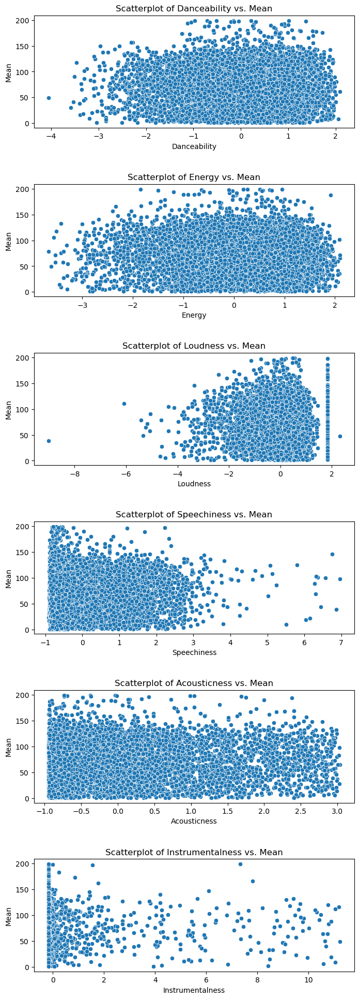

In [23]:
num_plots = len(predictors)

# Create subplots for scatterplots
fig, axes = pyplot.subplots(num_plots, 1, figsize=(8, 4 * num_plots))
fig.subplots_adjust(hspace=0.5)

# Create scatterplots for each predictor against the target
for i, predictor in enumerate(predictors):
    sns.scatterplot(x=predictor, y=target, data=result_df, ax=axes[i])
    axes[i].set_title(f'Scatterplot of {predictor} vs. {target}')


/home/sbochman/miniconda3/envs/aml/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


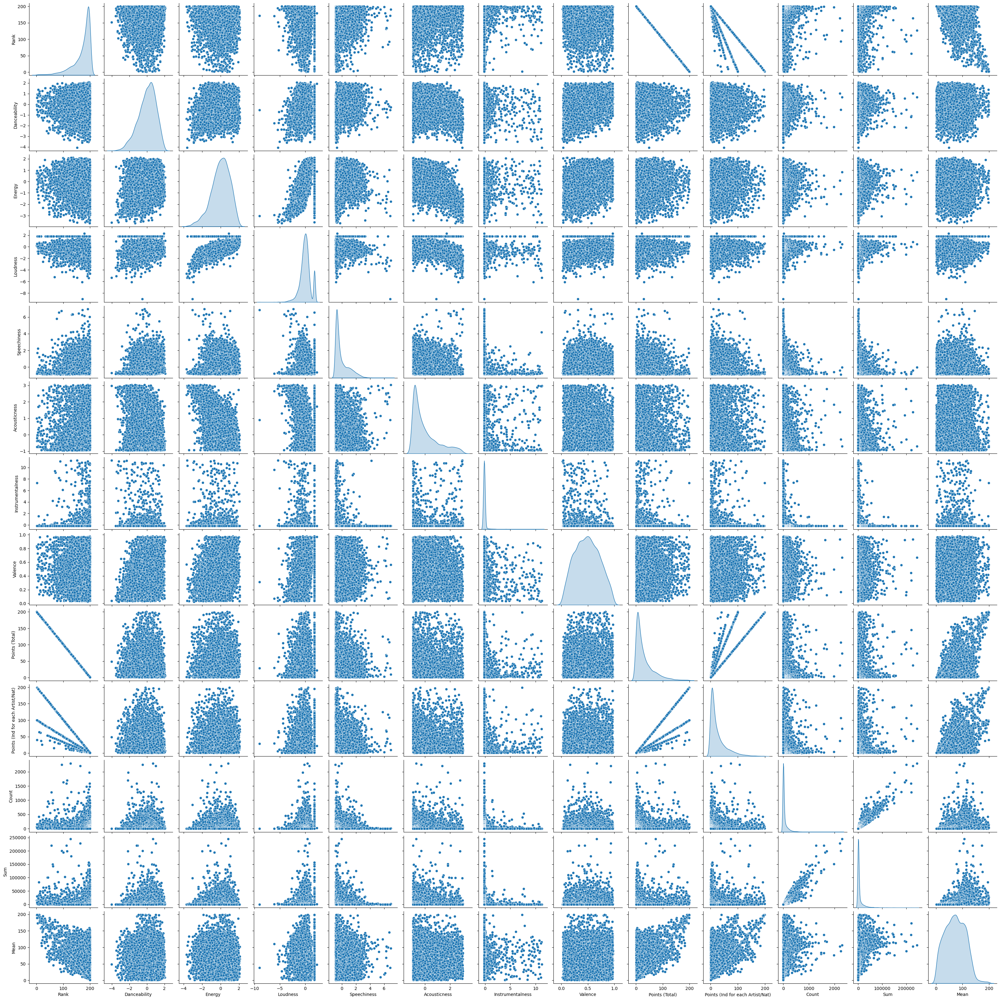

In [51]:
sns.pairplot(result_df, diag_kind='kde')
plt.show()

In [42]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [43]:
model = LinearRegression()
model.fit(X_train, y_train)


LinearRegression()

In [44]:
y_pred = model.predict(X_test)


In [45]:
mse = mean_squared_error(y_test, y_pred)
r_squared = r2_score(y_test, y_pred)
print("Root Mean Squared Error:", np.sqrt(mse))
print("R2 value:", r_squared)

Root Mean Squared Error: 38.46003493100806
R2 value: 0.0022180112882850267


# Random Forest

In [46]:
estimator = [10, 50, 100, 200]

r = []

for estimat in estimator:
    model = RandomForestRegressor(n_estimators=estimat, random_state=42)
    model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)
    r.append(r2_score(y_pred, y_test))



Text(0, 0.5, 'R2 value')

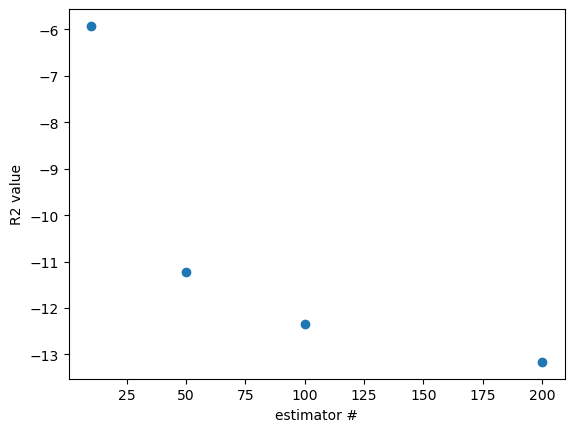

In [47]:
plt.scatter(estimator, r)
plt.xlabel("estimator #")
plt.ylabel("R2 value")

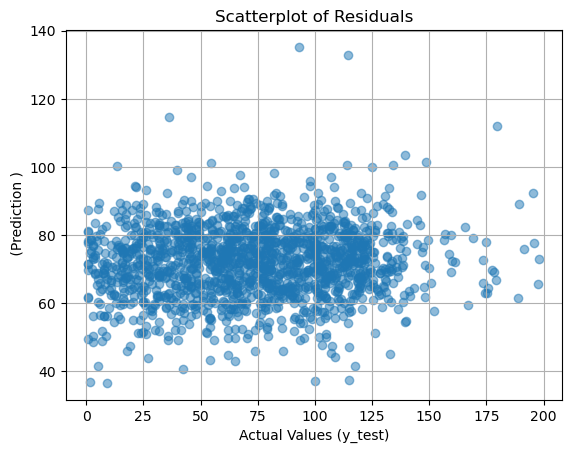

In [48]:
residuals = y_pred - y_test

# Create a scatterplot of the residuals
plt.scatter(y_test, y_pred, alpha=0.5)
plt.xlabel('Actual Values (y_test)')
plt.ylabel(' (Prediction )')
plt.title('Scatterplot of Residuals')
plt.grid(True)
plt.show()

In [49]:
mse = mean_squared_error(y_test, y_pred)
r_squared = r2_score(y_test, y_pred)
print("Root Mean Squared Error:", np.sqrt(mse))
print("R2 value:", r_squared)

Root Mean Squared Error: 39.15200062069549
R2 value: -0.03400878644946448


(array([245., 266., 274., 336., 369., 375., 392., 392., 464., 466., 454.,
        489., 415., 404., 404., 428., 386., 385., 305., 187., 152.,  70.,
         38.,  17.,  23.,  11.,  17.,  10.,  12.,  15.]),
 array([  1.        ,   7.60155039,  14.20310078,  20.80465116,
         27.40620155,  34.00775194,  40.60930233,  47.21085271,
         53.8124031 ,  60.41395349,  67.01550388,  73.61705426,
         80.21860465,  86.82015504,  93.42170543, 100.02325581,
        106.6248062 , 113.22635659, 119.82790698, 126.42945736,
        133.03100775, 139.63255814, 146.23410853, 152.83565891,
        159.4372093 , 166.03875969, 172.64031008, 179.24186047,
        185.84341085, 192.44496124, 199.04651163]),
 <BarContainer object of 30 artists>)

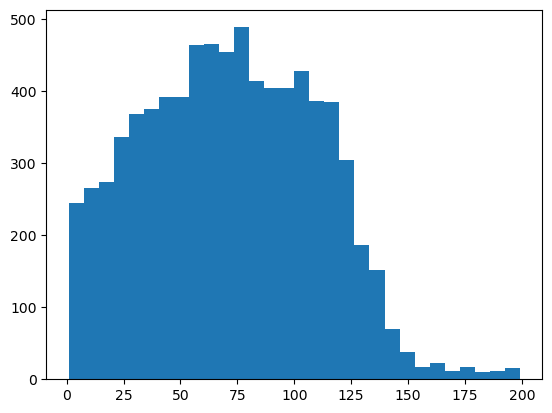

In [50]:

plt.hist(result_df['Mean'], bins = 30)

# Exploration

In [105]:
dataframe = pd.read_csv("Spotify_Dataset_V3.csv", delimiter = ";")

In [106]:
dataframe = dataframe.drop_duplicates(subset = ['Title', 'Artists', 'Date'], keep = 'first')
dataframe = dataframe.reset_index(drop = True)
dataframe.head(10)

,Rank,Title,Artists,Date,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,Valence,# of Artist,Artist (Ind.),# of Nationality,Nationality,Continent,Points (Total),Points (Ind for each Artist/Nat),id,Song URL
0,1,Ella Baila Sola,"Eslabon Armado, Peso Pluma",29/05/2023,0.668,0.758,-5176.0,0.033,0.483,0.000,0.834,Artist 1,Eslabon Armado,Nationality 1,Mexico,Latin-America,200,100.0,3qQbCzHBycnDpGskqOWY0E,https://open.spotify.com/track/3qQbCzHBycnDpGs...
1,2,WHERE SHE GOES,Bad Bunny,29/05/2023,0.652,0.800,-4019.0,0.061,0.143,0.629,0.234,Artist 1,Bad Bunny,Nationality 1,Puerto Rico,Latin-America,199,199.0,7ro0hRteUMfnOioTFI5TG1,https://open.spotify.com/track/7ro0hRteUMfnOio...
2,3,La Bebe - Remix,"Yng Lvcas, Peso Pluma",29/05/2023,0.812,0.479,-5678.0,0.333,0.213,0.000,0.559,Artist 1,Yng Lvcas,Nationality 1,Mexico,Latin-America,198,99.0,2UW7JaomAMuX9pZrjVpHAU,https://open.spotify.com/track/2UW7JaomAMuX9pZ...
3,4,Cupid - Twin Ver.,FIFTY FIFTY,29/05/2023,0.783,0.592,-8332.0,0.033,0.435,0.000,0.726,Artist 1,FIFTY FIFTY,Nationality 1,South Korea,Asia,197,197.0,7FbrGaHYVDmfr7KoLIZnQ7,https://open.spotify.com/track/7FbrGaHYVDmfr7K...
4,5,un x100to,"Grupo Frontera, Bad Bunny",29/05/2023,0.569,0.724,-4076.0,0.047,0.228,0.000,0.562,Artist 1,Grupo Frontera,Nationality 1,Mexico,Latin-America,196,98.0,6pD0ufEQq0xdHSsRbg9LBK,https://open.spotify.com/track/6pD0ufEQq0xdHSs...
5,6,Flowers,Miley Cyrus,29/05/2023,0.707,0.681,-4325.0,0.067,0.063,0.000,0.646,Artist 1,Miley Cyrus,Nationality 1,United States,Anglo-America,195,195.0,4DHcnVTT87F0zZhRPYmZ3B,https://open.spotify.com/track/4DHcnVTT87F0zZh...
6,7,Daylight,David Kushner,29/05/2023,0.508,0.430,-9475.0,0.034,0.830,0.000,0.324,Artist 1,David Kushner,Nationality 1,United States,Anglo-America,194,194.0,1odExI7RdWc4BT515LTAwj,https://open.spotify.com/track/1odExI7RdWc4BT5...
7,8,Kill Bill,SZA,29/05/2023,0.644,0.735,-5747.0,0.039,0.052,0.144,0.418,Artist 1,SZA,Nationality 1,United States,Anglo-America,193,193.0,1Qrg8KqiBpW07V7PNxwwwL,https://open.spotify.com/track/1Qrg8KqiBpW07V7...
8,9,As It Was,Harry Styles,29/05/2023,0.520,0.731,-5338.0,0.056,0.342,0.001,0.662,Artist 1,Harry Styles,Nationality 1,United Kingdom,Europe,192,192.0,4Dvkj6JhhA12EX05fT7y2e,https://open.spotify.com/track/4Dvkj6JhhA12EX0...
9,10,TQG,"KAROL G, Shakira",29/05/2023,0.720,0.630,-3547.0,0.277,0.673,0.000,0.607,Artist 1,KAROL G,Nationality 1,Colombia,Latin-America,191,95.5,0DWdj2oZMBFSzRsi2Cvfzf,https://open.spotify.com/track/0DWdj2oZMBFSzRs...


In [107]:
count_df = dataframe.groupby(['Title', 'Artists'])['Points (Total)'].agg(['count', 'sum']).reset_index()
count_df.columns = ['Title', 'Artists', 'Count', 'Sum']

result_df = dataframe.merge(count_df, on=['Title', 'Artists'], how='left')
result_df

,Rank,Title,Artists,Date,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,...,Artist (Ind.),# of Nationality,Nationality,Continent,Points (Total),Points (Ind for each Artist/Nat),id,Song URL,Count,Sum
0,1,Ella Baila Sola,"Eslabon Armado, Peso Pluma",29/05/2023,0.668,0.758,-5176.0,0.033,0.483,0.000,...,Eslabon Armado,Nationality 1,Mexico,Latin-America,200,100.0,3qQbCzHBycnDpGskqOWY0E,https://open.spotify.com/track/3qQbCzHBycnDpGs...,74,14624
1,2,WHERE SHE GOES,Bad Bunny,29/05/2023,0.652,0.800,-4019.0,0.061,0.143,0.629,...,Bad Bunny,Nationality 1,Puerto Rico,Latin-America,199,199.0,7ro0hRteUMfnOioTFI5TG1,https://open.spotify.com/track/7ro0hRteUMfnOio...,11,2188
2,3,La Bebe - Remix,"Yng Lvcas, Peso Pluma",29/05/2023,0.812,0.479,-5678.0,0.333,0.213,0.000,...,Yng Lvcas,Nationality 1,Mexico,Latin-America,198,99.0,2UW7JaomAMuX9pZrjVpHAU,https://open.spotify.com/track/2UW7JaomAMuX9pZ...,73,13806
3,4,Cupid - Twin Ver.,FIFTY FIFTY,29/05/2023,0.783,0.592,-8332.0,0.033,0.435,0.000,...,FIFTY FIFTY,Nationality 1,South Korea,Asia,197,197.0,7FbrGaHYVDmfr7KoLIZnQ7,https://open.spotify.com/track/7FbrGaHYVDmfr7K...,78,13467
4,5,un x100to,"Grupo Frontera, Bad Bunny",29/05/2023,0.569,0.724,-4076.0,0.047,0.228,0.000,...,Grupo Frontera,Nationality 1,Mexico,Latin-America,196,98.0,6pD0ufEQq0xdHSsRbg9LBK,https://open.spotify.com/track/6pD0ufEQq0xdHSs...,43,8559
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
470400,196,White Iverson,Post Malone,01/01/2017,0.675,0.562,-7678.0,0.035,0.233,0.000,...,Post Malone,Nationality 1,United States,Anglo-America,5,5.0,6eT7xZZlB2mwyzJ2sUKG6w,https://open.spotify.com/track/6eT7xZZlB2mwyzJ...,395,14460
470401,197,Oh Lord,MiC LOWRY,01/01/2017,0.273,0.794,-6644.0,0.068,0.022,0.000,...,MiC LOWRY,Nationality 1,United Kingdom,Europe,4,4.0,1sTUEdVO85YU8Ymk2jeAls,https://open.spotify.com/track/1sTUEdVO85YU8Ym...,25,1201
470402,198,Superstition - Single Version,Stevie Wonder,01/01/2017,0.650,0.658,-10908.0,0.085,0.089,0.004,...,Stevie Wonder,Nationality 1,United States,Anglo-America,3,3.0,5lXcSvHRVjQJ3LB2rLKQog,https://open.spotify.com/track/5lXcSvHRVjQJ3LB...,6,135
470403,199,Secrets,The Weeknd,01/01/2017,0.665,0.771,-5779.0,0.053,0.016,0.000,...,The Weeknd,Nationality 1,Canada,Anglo-America,2,2.0,3DX4Y0egvc0slLcLl31h2p,https://open.spotify.com/track/3DX4Y0egvc0slLc...,10,124


In [55]:
Ella = dataframe[dataframe["Title"] == "As It Was"]
Ella

,Rank,Title,Artists,Date,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,Valence,# of Artist,Artist (Ind.),# of Nationality,Nationality,Continent,Points (Total),Points (Ind for each Artist/Nat),id,Song URL
8,9,As It Was,Harry Styles,2023-05-29,0.52,0.731,-5338.0,0.056,0.342,0.001,0.662,Artist 1,Harry Styles,Nationality 1,United Kingdom,Europe,192,192.0,4Dvkj6JhhA12EX05fT7y2e,https://open.spotify.com/track/4Dvkj6JhhA12EX0...
207,8,As It Was,Harry Styles,2023-05-28,0.52,0.731,-5338.0,0.056,0.342,0.001,0.662,Artist 1,Harry Styles,Nationality 1,United Kingdom,Europe,193,193.0,4Dvkj6JhhA12EX05fT7y2e,https://open.spotify.com/track/4Dvkj6JhhA12EX0...
406,7,As It Was,Harry Styles,2023-05-27,0.52,0.731,-5338.0,0.056,0.342,0.001,0.662,Artist 1,Harry Styles,Nationality 1,United Kingdom,Europe,194,194.0,4Dvkj6JhhA12EX05fT7y2e,https://open.spotify.com/track/4Dvkj6JhhA12EX0...
611,12,As It Was,Harry Styles,2023-05-26,0.52,0.731,-5338.0,0.056,0.342,0.001,0.662,Artist 1,Harry Styles,Nationality 1,United Kingdom,Europe,189,189.0,4Dvkj6JhhA12EX05fT7y2e,https://open.spotify.com/track/4Dvkj6JhhA12EX0...
808,9,As It Was,Harry Styles,2023-05-25,0.52,0.731,-5338.0,0.056,0.342,0.001,0.662,Artist 1,Harry Styles,Nationality 1,United Kingdom,Europe,192,192.0,4Dvkj6JhhA12EX05fT7y2e,https://open.spotify.com/track/4Dvkj6JhhA12EX0...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84703,1,As It Was,Harry Styles,2022-04-04,0.52,0.731,-5338.0,0.056,0.342,0.001,0.662,Artist 1,Harry Styles,Nationality 1,United Kingdom,Europe,200,200.0,4LRPiXqCikLlN15c3yImP7,https://open.spotify.com/track/4LRPiXqCikLlN15...
84899,1,As It Was,Harry Styles,2022-04-03,0.52,0.731,-5338.0,0.056,0.342,0.001,0.662,Artist 1,Harry Styles,Nationality 1,United Kingdom,Europe,200,200.0,4LRPiXqCikLlN15c3yImP7,https://open.spotify.com/track/4LRPiXqCikLlN15...
85114,1,As It Was,Harry Styles,2022-04-02,0.52,0.731,-5338.0,0.056,0.342,0.001,0.662,Artist 1,Harry Styles,Nationality 1,United Kingdom,Europe,200,200.0,4LRPiXqCikLlN15c3yImP7,https://open.spotify.com/track/4LRPiXqCikLlN15...
85318,1,As It Was,Harry Styles,2022-04-01,0.52,0.731,-5338.0,0.056,0.342,0.001,0.662,Artist 1,Harry Styles,Nationality 1,United Kingdom,Europe,200,200.0,4LRPiXqCikLlN15c3yImP7,https://open.spotify.com/track/4LRPiXqCikLlN15...


/tmp/ipykernel_467/2545861736.py:6: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  temp['Date'] = pd.to_datetime(temp['Date'])


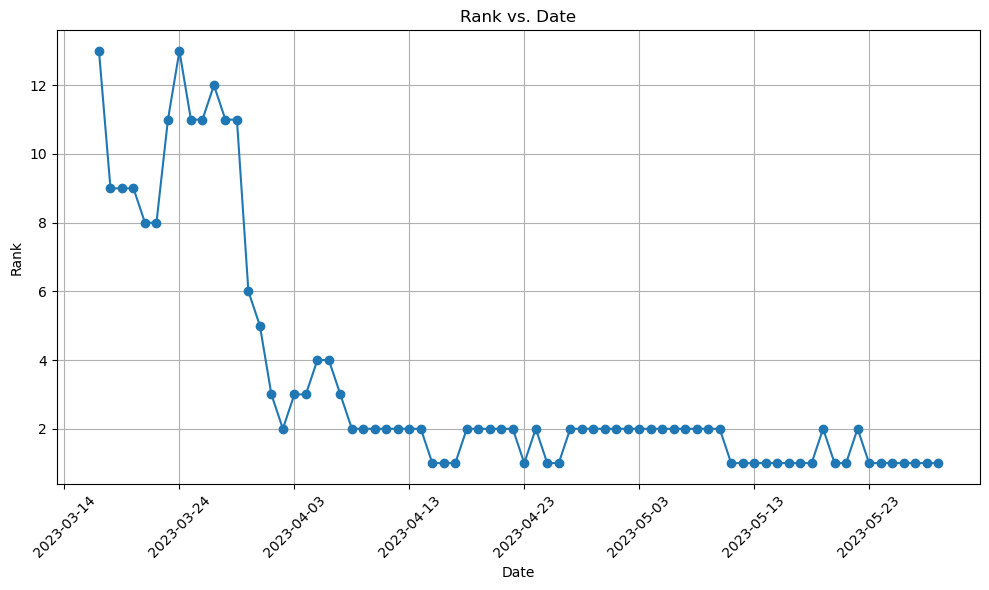

In [28]:
from matplotlib.ticker import MaxNLocator
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed

# Plot the data
temp = Ella.copy()
temp['Date'] = pd.to_datetime(temp['Date'])

# Sort the DataFrame by the "Date" column in ascending order
temp = temp.sort_values(by='Date')

plt.plot(temp['Date'], temp['Rank'], marker='o', linestyle='-')

# Add labels and title
plt.xlabel('Date')
plt.ylabel('Rank')
plt.title('Rank vs. Date')

# Display the graph
plt.grid(True)
ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(nbins=10))
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Ensures the labels fit within the figure boundaries
plt.show()

In [48]:
first_ten = dataframe.head(10)

In [60]:
first_titles = []
for index,row in first_ten.iterrows():
    first_titles.append([row["Title"],row["Artists"]])

first_titles

[['Ella Baila Sola', 'Eslabon Armado, Peso Pluma'],
 ['WHERE SHE GOES', 'Bad Bunny'],
 ['La Bebe - Remix', 'Yng Lvcas, Peso Pluma'],
 ['Cupid - Twin Ver.', 'FIFTY FIFTY'],
 ['un x100to', 'Grupo Frontera, Bad Bunny'],
 ['Flowers', 'Miley Cyrus'],
 ['Daylight', 'David Kushner'],
 ['Kill Bill', 'SZA'],
 ['As It Was', 'Harry Styles'],
 ['TQG', 'KAROL G, Shakira']]

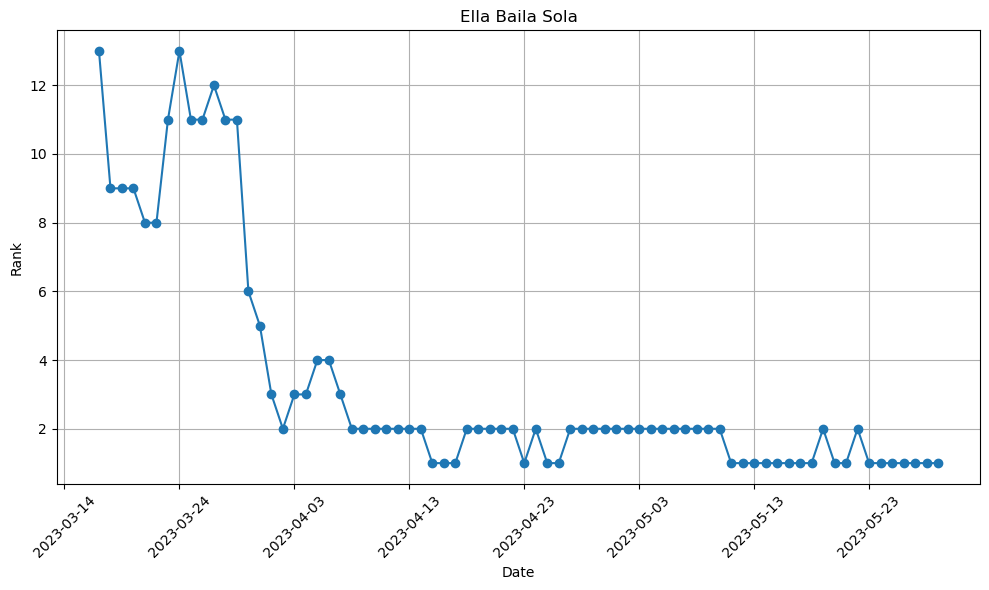

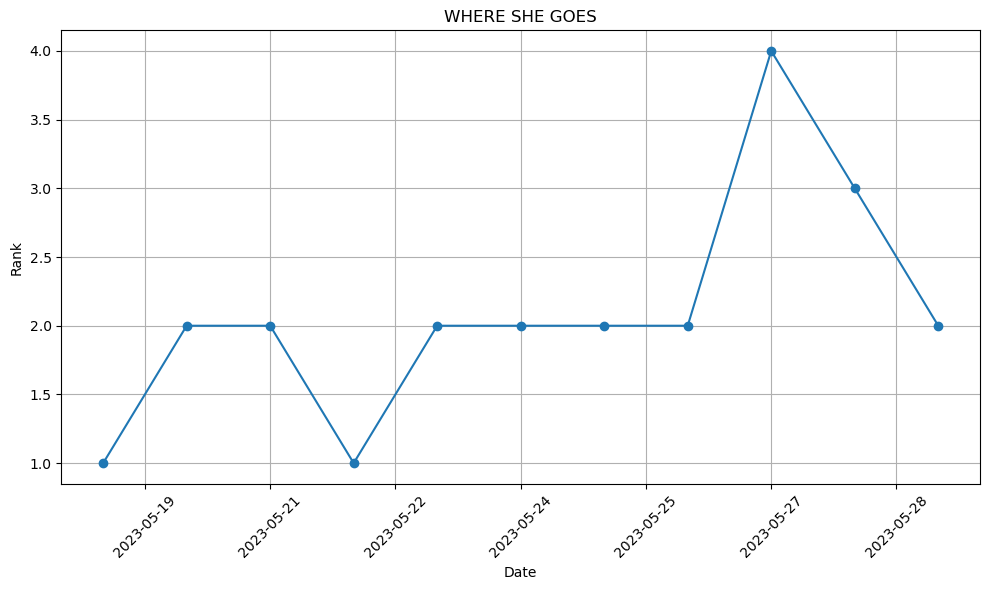

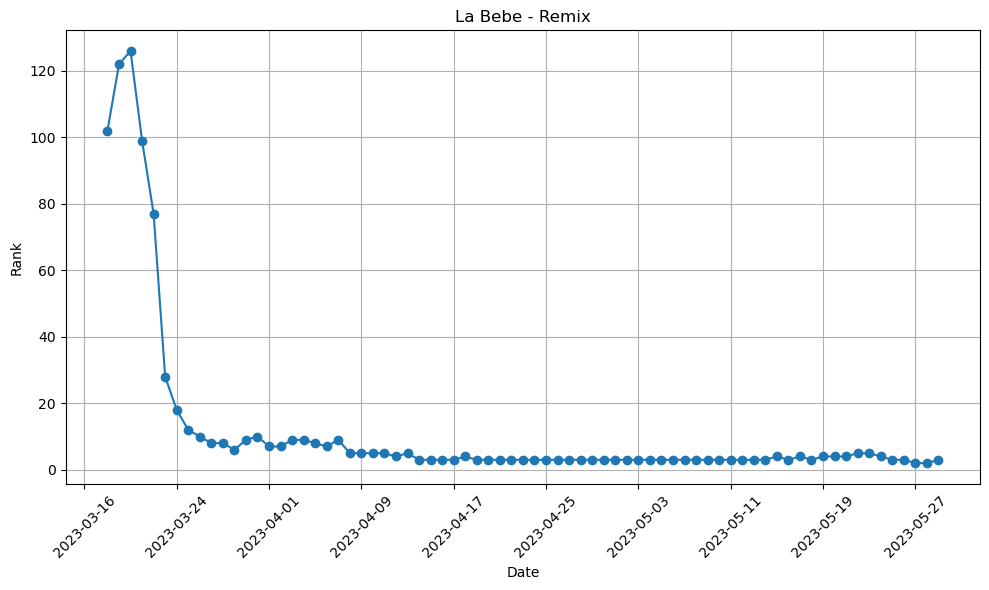

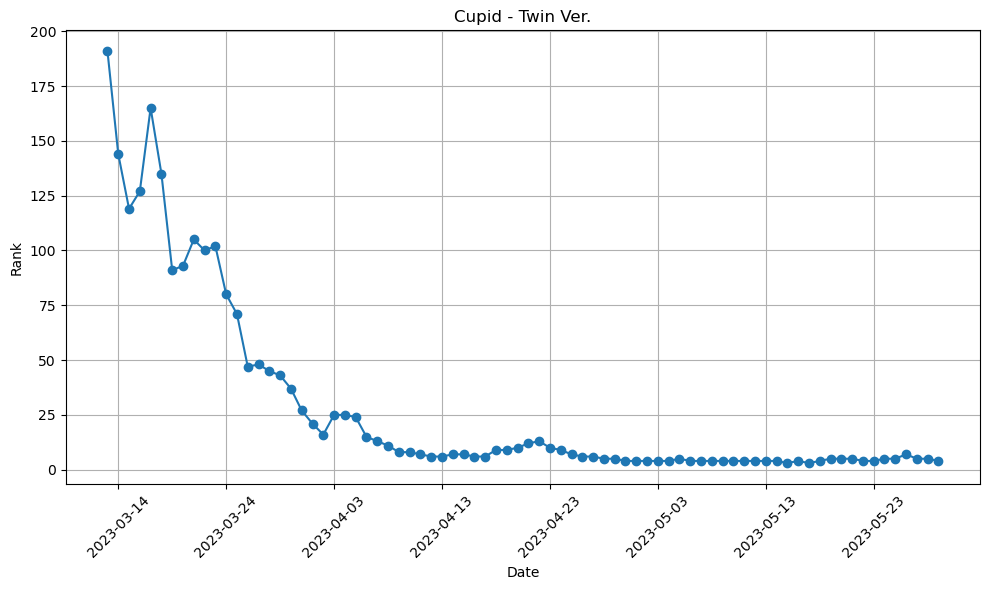

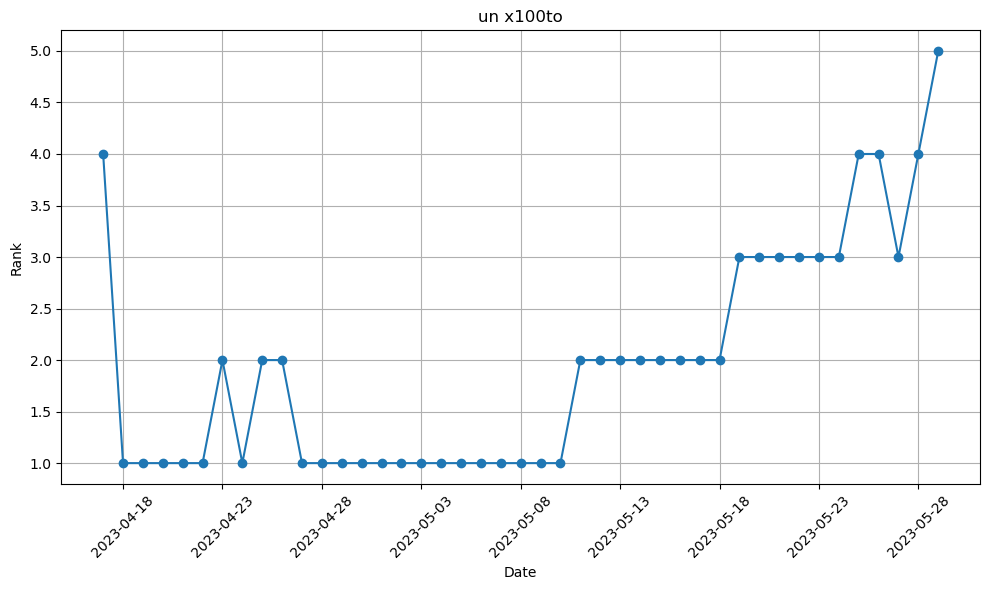

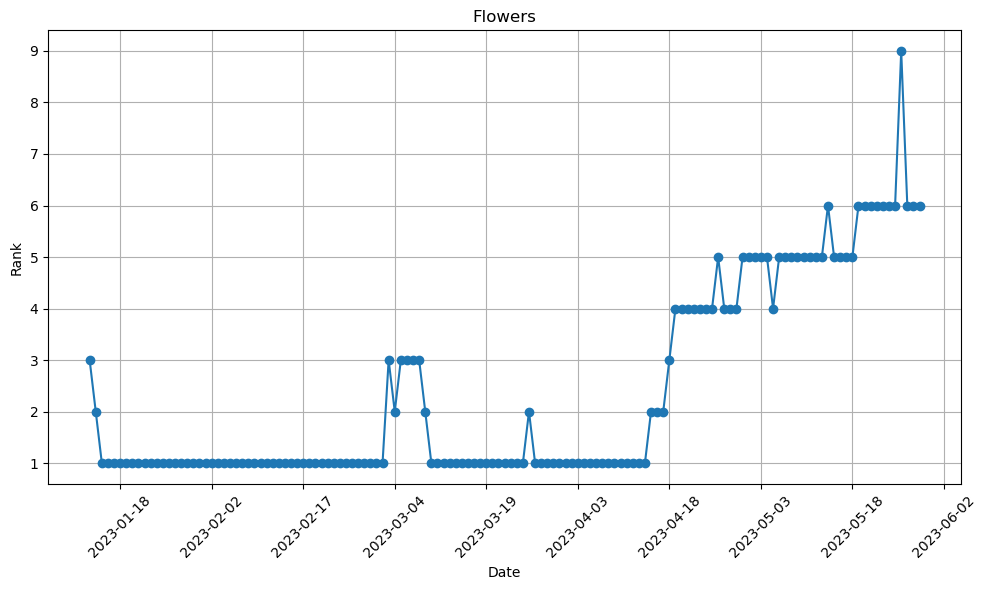

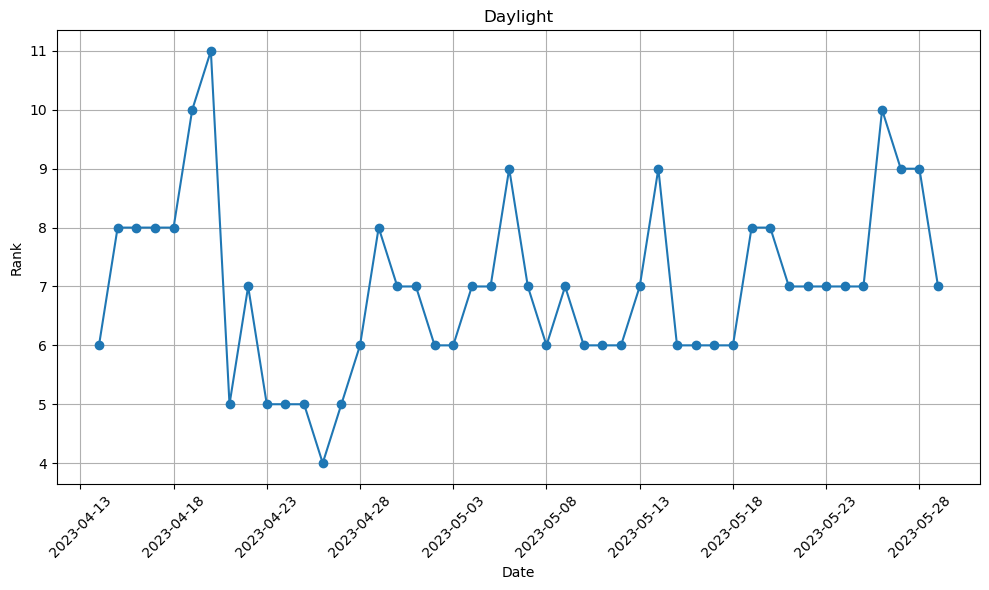

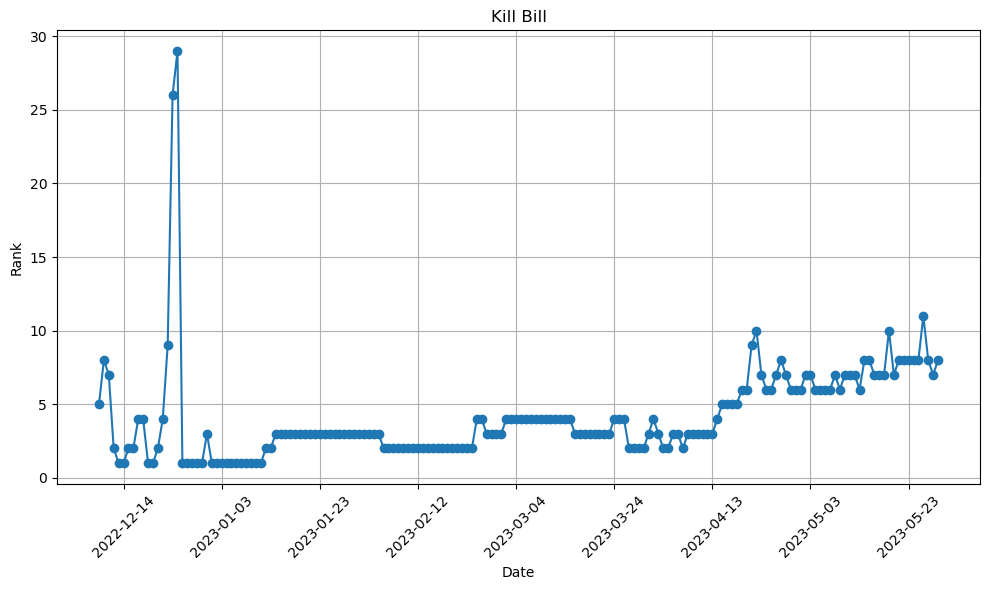

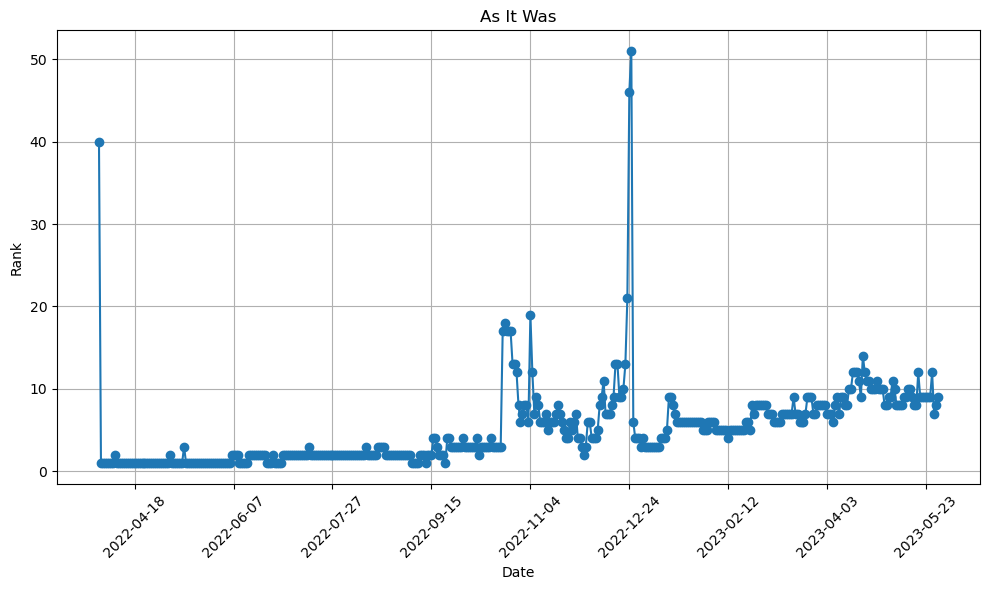

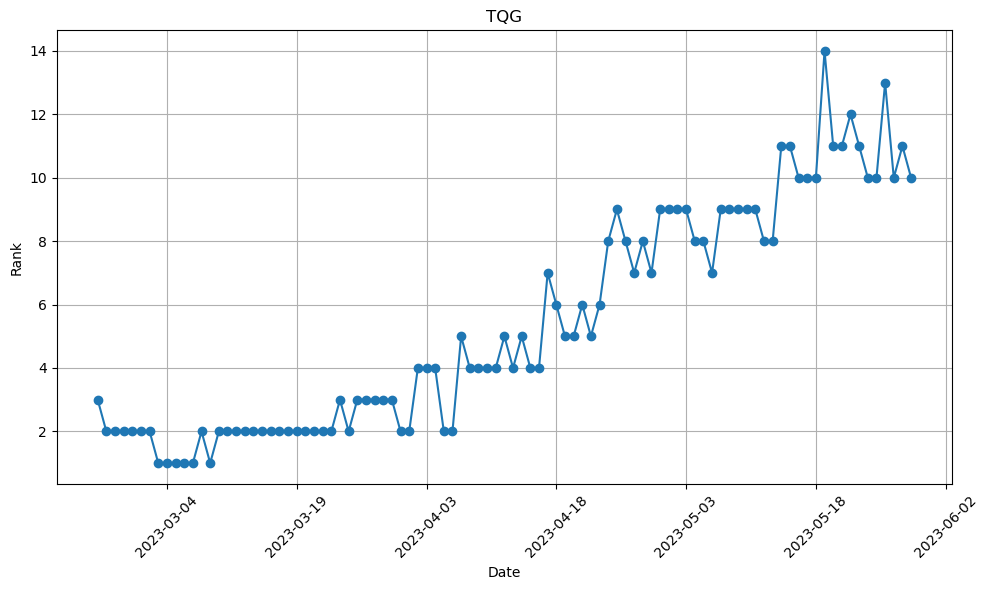

In [61]:
for title, artist in first_titles:
    temp = dataframe[dataframe["Title"] == title]
    temp = temp[temp["Artists"] == artist]
    plt.figure(figsize=(10, 6))  # Adjust the figure size as needed

    temp['Date'] = pd.to_datetime(temp['Date'])

    # Sort the DataFrame by the "Date" column in ascending order
    temp = temp.sort_values(by='Date')

    plt.plot(temp['Date'], temp['Rank'], marker='o', linestyle='-')

# Add labels and title
    plt.xlabel('Date')
    plt.ylabel('Rank')
    plt.title(title)

# Display the graph
    plt.grid(True)
    ax = plt.gca()
    ax.xaxis.set_major_locator(MaxNLocator(nbins=10))
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
    plt.tight_layout()  # Ensures the labels fit within the figure boundaries
    plt.show()

In [108]:
result_df['Date'] = pd.to_datetime(result_df['Date'])
result_df = result_df.sort_values(by='Date')

# Calculate the maximum and minimum rank for each song
result_df['Lowest Rank'] = result_df.groupby(['Title', 'Artists'])['Rank'].transform('max')
result_df['Highest Rank'] = result_df.groupby(['Title', 'Artists'])['Rank'].transform('min')
result_df['Date of Lowest Rank'] = result_df.groupby(['Title', 'Artists'])['Date'].transform(lambda x: x[x.idxmax()])
result_df['Date of Highest Rank'] = result_df.groupby(['Title', 'Artists'])['Date'].transform(lambda x: x[x.idxmin()])

result_df

/tmp/ipykernel_467/1350539371.py:1: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  result_df['Date'] = pd.to_datetime(result_df['Date'])


,Rank,Title,Artists,Date,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,...,Points (Total),Points (Ind for each Artist/Nat),id,Song URL,Count,Sum,Lowest Rank,Highest Rank,Date of Lowest Rank,Date of Highest Rank
470404,200,Ni**as In Paris,"JAY-Z, Kanye West",2017-01-01,0.757,0.882,-6125.00,0.248,0.076,0.000,...,1,1.0,2KpCpk6HjXXLb7nnXoXA5O,https://open.spotify.com/track/2KpCpk6HjXXLb7n...,1,1,200,200,2017-01-01,2017-01-01
470275,71,Traicionera,Sebastian Yatra,2017-01-01,0.776,0.669,-4933.00,0.064,0.142,0.000,...,130,130.0,5J1c3M4EldCfNxXwrwt8mT,https://open.spotify.com/track/5J1c3M4EldCfNxX...,209,10272,200,71,2017-08-20,2017-01-01
470274,70,Light It Up (feat. Nyla & Fuse ODG) - Remix,Major Lazer,2017-01-01,0.746,0.877,-3782.00,0.067,0.038,0.001,...,131,131.0,0L7loeTIg6akW84aEQZpCT,https://open.spotify.com/track/0L7loeTIg6akW84...,105,4317,200,70,2018-01-01,2017-01-01
470273,69,Controlla,Drake,2017-01-01,0.607,0.476,-11076.00,0.249,0.077,0.000,...,132,132.0,6F609ICg9Spjrw1epsAnpa,https://open.spotify.com/track/6F609ICg9Spjrw1...,94,5937,200,69,2017-04-09,2017-01-01
470272,68,The Greatest (feat. Kendrick Lamar),Sia,2017-01-01,0.668,0.725,-6127.00,0.266,0.010,0.000,...,133,133.0,7xHWNBFm6ObGEQPaUxHuKO,https://open.spotify.com/track/7xHWNBFm6ObGEQP...,83,7951,198,46,2017-03-25,2017-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129,130,Everybody Wants To Rule The World,Tears For Fears,2023-05-29,0.645,0.795,-12095.00,0.053,0.347,0.004,...,71,71.0,4RvWPyQ5RL0ao9LPZeSouE,https://open.spotify.com/track/4RvWPyQ5RL0ao9L...,256,12431,200,95,2023-05-29,2022-05-31
128,129,Watermelon Sugar,Harry Styles,2023-05-29,0.548,0.816,-4209.00,0.047,0.122,0.000,...,72,72.0,6UelLqGlWMcVH1E5c4H7lY,https://open.spotify.com/track/6UelLqGlWMcVH1E...,1286,179764,198,4,2023-05-29,2019-11-17
127,128,Danza Kuduro,"Don Omar, Lucenzo",2023-05-29,0.400,0.915,-4.89,0.280,0.085,0.000,...,73,36.5,2a1o6ZejUi8U3wzzOtCOYw,https://open.spotify.com/track/2a1o6ZejUi8U3wz...,30,1253,198,99,2023-05-29,2017-12-31
137,138,Tití Me Preguntó,Bad Bunny,2023-05-29,0.650,0.715,-5198.00,0.253,0.099,0.000,...,63,63.0,1IHWl5LamUGEuP4ozKQSXZ,https://open.spotify.com/track/1IHWl5LamUGEuP4...,389,63575,141,4,2023-05-29,2022-05-06


In [109]:
temp = result_df.copy()
temp = temp.drop_duplicates(subset = ['Title', 'Artists'], keep = 'first')
temp = temp.reset_index(drop = True)
temp['RankCategory'] = temp['Highest Rank'].apply(lambda x: 'Top 20' if x <= 20 else 'Below 20')

temp

,Rank,Title,Artists,Date,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,...,Points (Ind for each Artist/Nat),id,Song URL,Count,Sum,Lowest Rank,Highest Rank,Date of Lowest Rank,Date of Highest Rank,RankCategory
0,200,Ni**as In Paris,"JAY-Z, Kanye West",2017-01-01,0.757,0.882,-6125.0,0.248,0.076,0.000,...,1.000000,2KpCpk6HjXXLb7nnXoXA5O,https://open.spotify.com/track/2KpCpk6HjXXLb7n...,1,1,200,200,2017-01-01,2017-01-01,Below 20
1,71,Traicionera,Sebastian Yatra,2017-01-01,0.776,0.669,-4933.0,0.064,0.142,0.000,...,130.000000,5J1c3M4EldCfNxXwrwt8mT,https://open.spotify.com/track/5J1c3M4EldCfNxX...,209,10272,200,71,2017-08-20,2017-01-01,Below 20
2,70,Light It Up (feat. Nyla & Fuse ODG) - Remix,Major Lazer,2017-01-01,0.746,0.877,-3782.0,0.067,0.038,0.001,...,131.000000,0L7loeTIg6akW84aEQZpCT,https://open.spotify.com/track/0L7loeTIg6akW84...,105,4317,200,70,2018-01-01,2017-01-01,Below 20
3,69,Controlla,Drake,2017-01-01,0.607,0.476,-11076.0,0.249,0.077,0.000,...,132.000000,6F609ICg9Spjrw1epsAnpa,https://open.spotify.com/track/6F609ICg9Spjrw1...,94,5937,200,69,2017-04-09,2017-01-01,Below 20
4,68,The Greatest (feat. Kendrick Lamar),Sia,2017-01-01,0.668,0.725,-6127.0,0.266,0.010,0.000,...,133.000000,7xHWNBFm6ObGEQPaUxHuKO,https://open.spotify.com/track/7xHWNBFm6ObGEQP...,83,7951,198,46,2017-03-25,2017-01-01,Below 20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7796,171,Bye,Peso Pluma,2023-05-26,0.782,0.812,-6613.0,0.047,0.567,0.000,...,30.000000,6n2P81rPk2RTzwnNNgFOdb,https://open.spotify.com/track/6n2P81rPk2RTzwn...,4,368,171,85,2023-05-29,2023-05-26,Below 20
7797,184,Stand By Me (feat. Morgan Wallen),"Lil Durk, Morgan Wallen",2023-05-26,0.756,0.582,-7726.0,0.034,0.059,0.000,...,8.500000,1fXnu2HzxbDtoyvFPWG3Bw,https://open.spotify.com/track/1fXnu2HzxbDtoyv...,2,19,199,184,2023-05-27,2023-05-26,Below 20
7798,149,Friesenjung,"Ski Aggu, Joost, Otto Waalkes",2023-05-26,0.790,0.979,-4637.0,0.117,0.018,0.000,...,17.333333,6tAKikIvnoWfUeZrfkopLL,https://open.spotify.com/track/6tAKikIvnoWfUeZ...,1,52,149,149,2023-05-26,2023-05-26,Below 20
7799,176,"Phir Aur Kya Chahiye (From ""Zara Hatke Zara Ba...","Sachin-Jigar, Arijit Singh, Amitabha Bhattacharya",2023-05-27,0.556,0.552,-5875.0,0.037,0.531,0.000,...,8.333333,5QW9K4A1gMnIi94YUxtsfM,https://open.spotify.com/track/5QW9K4A1gMnIi94...,3,175,176,123,2023-05-29,2023-05-27,Below 20


In [110]:
from sklearn.preprocessing import StandardScaler

# Create a StandardScaler
scaler = StandardScaler()

# Standardize the 'Loudness' column
temp['Loudness'] = scaler.fit_transform(temp[['Loudness']])

# Create side-by-side boxplots using Seaborn


/tmp/ipykernel_467/1265591136.py:5: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  temp.boxplot(column=columns_to_plot, by='RankCategory', ax=ax, showfliers=False)


(array([1, 2, 1, 2, 1, 2, 1, 2, 1, 2, 1, 2]),
 [Text(1, 0, 'Below 20'),
  Text(2, 0, 'Top 20'),
  Text(1, 0, 'Below 20'),
  Text(2, 0, 'Top 20'),
  Text(1, 0, 'Below 20'),
  Text(2, 0, 'Top 20'),
  Text(1, 0, 'Below 20'),
  Text(2, 0, 'Top 20'),
  Text(1, 0, 'Below 20'),
  Text(2, 0, 'Top 20'),
  Text(1, 0, 'Below 20'),
  Text(2, 0, 'Top 20')])

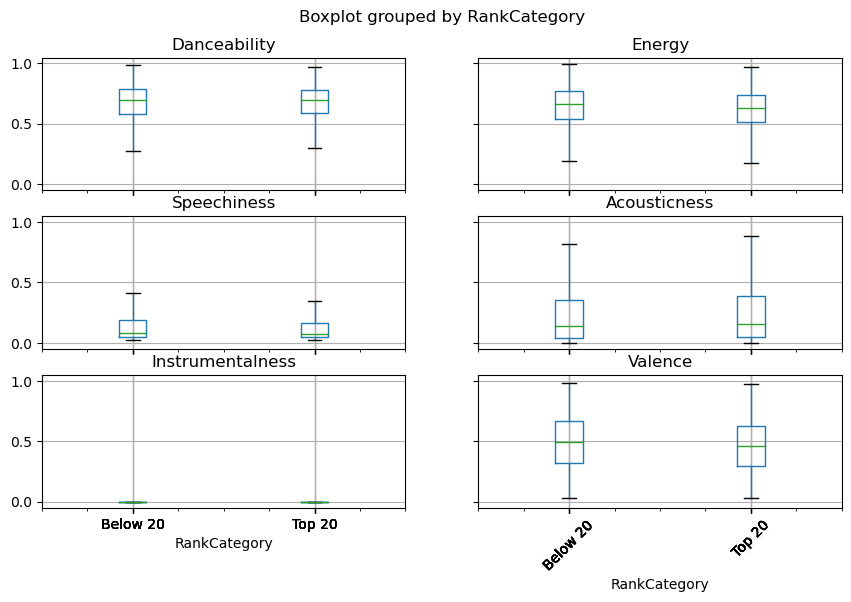

In [111]:
fig, ax = plt.subplots(figsize=(10, 6))

# Create side-by-side boxplots for multiple columns
columns_to_plot = ['Danceability', 'Energy', 'Speechiness', 'Acousticness', 'Instrumentalness', 'Valence']
temp.boxplot(column=columns_to_plot, by='RankCategory', ax=ax, showfliers=False)

# Customize labels and title
ax.set_xlabel('Rank Category')
ax.set_ylabel('Value')
ax.set_title('Side-by-Side Boxplots of Multiple Columns')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)


Text(0.5, 1.0, 'Side-by-Side Boxplots of Multiple Columns')

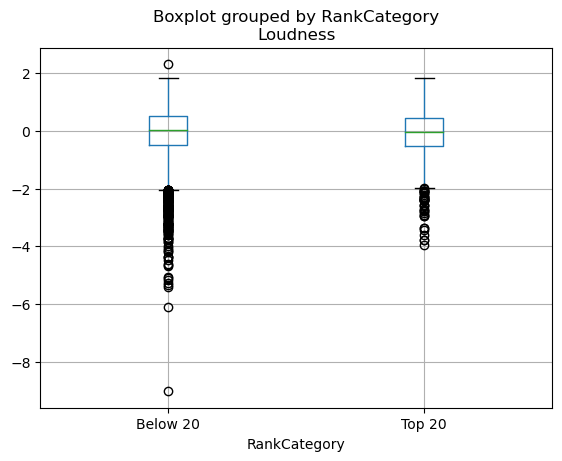

In [112]:
temp.boxplot(column="Loudness", by='RankCategory')
ax.set_xlabel('Rank Category')
ax.set_ylabel('Value')
ax.set_title('Side-by-Side Boxplots of Multiple Columns')


/tmp/ipykernel_467/3845235363.py:5: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  temp.boxplot(column=columns_to_plot, by='Continent', ax=ax, showfliers=False)


(array([1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1,
        2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7]),
 [Text(1, 0, 'Africa'),
  Text(2, 0, 'Anglo-America'),
  Text(3, 0, 'Asia'),
  Text(4, 0, 'Europe'),
  Text(5, 0, 'Latin-America'),
  Text(6, 0, 'Oceania'),
  Text(7, 0, 'Unknown'),
  Text(1, 0, 'Africa'),
  Text(2, 0, 'Anglo-America'),
  Text(3, 0, 'Asia'),
  Text(4, 0, 'Europe'),
  Text(5, 0, 'Latin-America'),
  Text(6, 0, 'Oceania'),
  Text(7, 0, 'Unknown'),
  Text(1, 0, 'Africa'),
  Text(2, 0, 'Anglo-America'),
  Text(3, 0, 'Asia'),
  Text(4, 0, 'Europe'),
  Text(5, 0, 'Latin-America'),
  Text(6, 0, 'Oceania'),
  Text(7, 0, 'Unknown'),
  Text(1, 0, 'Africa'),
  Text(2, 0, 'Anglo-America'),
  Text(3, 0, 'Asia'),
  Text(4, 0, 'Europe'),
  Text(5, 0, 'Latin-America'),
  Text(6, 0, 'Oceania'),
  Text(7, 0, 'Unknown'),
  Text(1, 0, 'Africa'),
  Text(2, 0, 'Anglo-America'),
  Text(3, 0, 'Asia'),
  Text(4, 0, 'Europe'),
  Text(5, 0, 'Latin-America

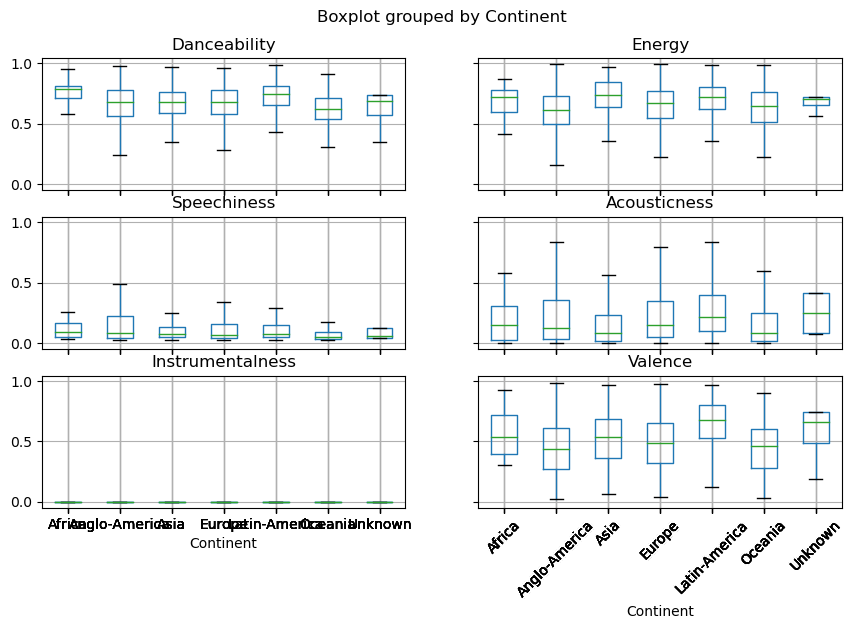

In [113]:
fig, ax = plt.subplots(figsize=(10, 6))

# Create side-by-side boxplots for multiple columns
columns_to_plot = ['Danceability', 'Energy', 'Speechiness', 'Acousticness', 'Instrumentalness', 'Valence']
temp.boxplot(column=columns_to_plot, by='Continent', ax=ax, showfliers=False)

# Customize labels and title
ax.set_xlabel('Rank Category')
ax.set_ylabel('Value')
ax.set_title('Side-by-Side Boxplots of Multiple Columns')
plt.xticks(rotation=45)

In [114]:
temp['Rank Difference'] = abs(temp['Highest Rank'] - temp['Lowest Rank'])
temp

,Rank,Title,Artists,Date,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,...,id,Song URL,Count,Sum,Lowest Rank,Highest Rank,Date of Lowest Rank,Date of Highest Rank,RankCategory,Rank Difference
0,200,Ni**as In Paris,"JAY-Z, Kanye West",2017-01-01,0.757,0.882,-0.089415,0.248,0.076,0.000,...,2KpCpk6HjXXLb7nnXoXA5O,https://open.spotify.com/track/2KpCpk6HjXXLb7n...,1,1,200,200,2017-01-01,2017-01-01,Below 20,0
1,71,Traicionera,Sebastian Yatra,2017-01-01,0.776,0.669,0.286477,0.064,0.142,0.000,...,5J1c3M4EldCfNxXwrwt8mT,https://open.spotify.com/track/5J1c3M4EldCfNxX...,209,10272,200,71,2017-08-20,2017-01-01,Below 20,129
2,70,Light It Up (feat. Nyla & Fuse ODG) - Remix,Major Lazer,2017-01-01,0.746,0.877,0.649440,0.067,0.038,0.001,...,0L7loeTIg6akW84aEQZpCT,https://open.spotify.com/track/0L7loeTIg6akW84...,105,4317,200,70,2018-01-01,2017-01-01,Below 20,130
3,69,Controlla,Drake,2017-01-01,0.607,0.476,-1.650690,0.249,0.077,0.000,...,6F609ICg9Spjrw1epsAnpa,https://open.spotify.com/track/6F609ICg9Spjrw1...,94,5937,200,69,2017-04-09,2017-01-01,Below 20,131
4,68,The Greatest (feat. Kendrick Lamar),Sia,2017-01-01,0.668,0.725,-0.090045,0.266,0.010,0.000,...,7xHWNBFm6ObGEQPaUxHuKO,https://open.spotify.com/track/7xHWNBFm6ObGEQP...,83,7951,198,46,2017-03-25,2017-01-01,Below 20,152
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7796,171,Bye,Peso Pluma,2023-05-26,0.782,0.812,-0.243303,0.047,0.567,0.000,...,6n2P81rPk2RTzwnNNgFOdb,https://open.spotify.com/track/6n2P81rPk2RTzwn...,4,368,171,85,2023-05-29,2023-05-26,Below 20,86
7797,184,Stand By Me (feat. Morgan Wallen),"Lil Durk, Morgan Wallen",2023-05-26,0.756,0.582,-0.594283,0.034,0.059,0.000,...,1fXnu2HzxbDtoyvFPWG3Bw,https://open.spotify.com/track/1fXnu2HzxbDtoyv...,2,19,199,184,2023-05-27,2023-05-26,Below 20,15
7798,149,Friesenjung,"Ski Aggu, Joost, Otto Waalkes",2023-05-26,0.790,0.979,0.379819,0.117,0.018,0.000,...,6tAKikIvnoWfUeZrfkopLL,https://open.spotify.com/track/6tAKikIvnoWfUeZ...,1,52,149,149,2023-05-26,2023-05-26,Below 20,0
7799,176,"Phir Aur Kya Chahiye (From ""Zara Hatke Zara Ba...","Sachin-Jigar, Arijit Singh, Amitabha Bhattacharya",2023-05-27,0.556,0.552,-0.010578,0.037,0.531,0.000,...,5QW9K4A1gMnIi94YUxtsfM,https://open.spotify.com/track/5QW9K4A1gMnIi94...,3,175,176,123,2023-05-29,2023-05-27,Below 20,53


<Axes: >

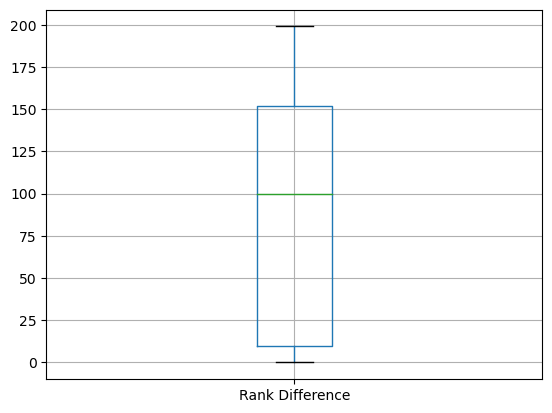

In [115]:
temp.boxplot(column="Rank Difference")

(array([2068.,  296.,  380.,  529.,  614.,  750.,  762.,  750.,  791.,
         861.]),
 array([  0. ,  19.9,  39.8,  59.7,  79.6,  99.5, 119.4, 139.3, 159.2,
        179.1, 199. ]),
 <BarContainer object of 10 artists>)

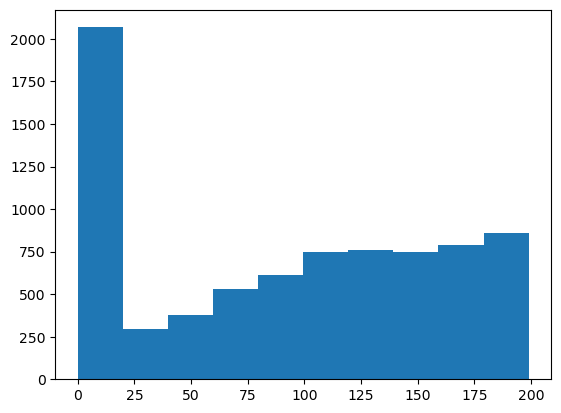

In [100]:
plt.hist(temp["Rank Difference"])

In [117]:
temp["Difference from Max to Min"] = (abs(temp["Date of Highest Rank"] - temp["Date of Lowest Rank"])).dt.days
temp

,Rank,Title,Artists,Date,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,...,Song URL,Count,Sum,Lowest Rank,Highest Rank,Date of Lowest Rank,Date of Highest Rank,RankCategory,Rank Difference,Difference from Max to Min
0,200,Ni**as In Paris,"JAY-Z, Kanye West",2017-01-01,0.757,0.882,-0.089415,0.248,0.076,0.000,...,https://open.spotify.com/track/2KpCpk6HjXXLb7n...,1,1,200,200,2017-01-01,2017-01-01,Below 20,0,0
1,71,Traicionera,Sebastian Yatra,2017-01-01,0.776,0.669,0.286477,0.064,0.142,0.000,...,https://open.spotify.com/track/5J1c3M4EldCfNxX...,209,10272,200,71,2017-08-20,2017-01-01,Below 20,129,231
2,70,Light It Up (feat. Nyla & Fuse ODG) - Remix,Major Lazer,2017-01-01,0.746,0.877,0.649440,0.067,0.038,0.001,...,https://open.spotify.com/track/0L7loeTIg6akW84...,105,4317,200,70,2018-01-01,2017-01-01,Below 20,130,365
3,69,Controlla,Drake,2017-01-01,0.607,0.476,-1.650690,0.249,0.077,0.000,...,https://open.spotify.com/track/6F609ICg9Spjrw1...,94,5937,200,69,2017-04-09,2017-01-01,Below 20,131,98
4,68,The Greatest (feat. Kendrick Lamar),Sia,2017-01-01,0.668,0.725,-0.090045,0.266,0.010,0.000,...,https://open.spotify.com/track/7xHWNBFm6ObGEQP...,83,7951,198,46,2017-03-25,2017-01-01,Below 20,152,83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7796,171,Bye,Peso Pluma,2023-05-26,0.782,0.812,-0.243303,0.047,0.567,0.000,...,https://open.spotify.com/track/6n2P81rPk2RTzwn...,4,368,171,85,2023-05-29,2023-05-26,Below 20,86,3
7797,184,Stand By Me (feat. Morgan Wallen),"Lil Durk, Morgan Wallen",2023-05-26,0.756,0.582,-0.594283,0.034,0.059,0.000,...,https://open.spotify.com/track/1fXnu2HzxbDtoyv...,2,19,199,184,2023-05-27,2023-05-26,Below 20,15,1
7798,149,Friesenjung,"Ski Aggu, Joost, Otto Waalkes",2023-05-26,0.790,0.979,0.379819,0.117,0.018,0.000,...,https://open.spotify.com/track/6tAKikIvnoWfUeZ...,1,52,149,149,2023-05-26,2023-05-26,Below 20,0,0
7799,176,"Phir Aur Kya Chahiye (From ""Zara Hatke Zara Ba...","Sachin-Jigar, Arijit Singh, Amitabha Bhattacharya",2023-05-27,0.556,0.552,-0.010578,0.037,0.531,0.000,...,https://open.spotify.com/track/5QW9K4A1gMnIi94...,3,175,176,123,2023-05-29,2023-05-27,Below 20,53,2


In [127]:
temp["Sum of Features"] = temp['Danceability'] + temp['Energy'] + temp['Speechiness'] + temp['Acousticness'] + temp['Instrumentalness'] + temp['Valence']
temp

,Rank,Title,Artists,Date,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,...,Count,Sum,Lowest Rank,Highest Rank,Date of Lowest Rank,Date of Highest Rank,RankCategory,Rank Difference,Difference from Max to Min,Sum of Features
0,200,Ni**as In Paris,"JAY-Z, Kanye West",2017-01-01,0.757,0.882,-0.089415,0.248,0.076,0.000,...,1,1,200,200,2017-01-01,2017-01-01,Below 20,0,0,2.647
1,71,Traicionera,Sebastian Yatra,2017-01-01,0.776,0.669,0.286477,0.064,0.142,0.000,...,209,10272,200,71,2017-08-20,2017-01-01,Below 20,129,231,2.312
2,70,Light It Up (feat. Nyla & Fuse ODG) - Remix,Major Lazer,2017-01-01,0.746,0.877,0.649440,0.067,0.038,0.001,...,105,4317,200,70,2018-01-01,2017-01-01,Below 20,130,365,2.480
3,69,Controlla,Drake,2017-01-01,0.607,0.476,-1.650690,0.249,0.077,0.000,...,94,5937,200,69,2017-04-09,2017-01-01,Below 20,131,98,1.756
4,68,The Greatest (feat. Kendrick Lamar),Sia,2017-01-01,0.668,0.725,-0.090045,0.266,0.010,0.000,...,83,7951,198,46,2017-03-25,2017-01-01,Below 20,152,83,2.398
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7796,171,Bye,Peso Pluma,2023-05-26,0.782,0.812,-0.243303,0.047,0.567,0.000,...,4,368,171,85,2023-05-29,2023-05-26,Below 20,86,3,2.908
7797,184,Stand By Me (feat. Morgan Wallen),"Lil Durk, Morgan Wallen",2023-05-26,0.756,0.582,-0.594283,0.034,0.059,0.000,...,2,19,199,184,2023-05-27,2023-05-26,Below 20,15,1,2.036
7798,149,Friesenjung,"Ski Aggu, Joost, Otto Waalkes",2023-05-26,0.790,0.979,0.379819,0.117,0.018,0.000,...,1,52,149,149,2023-05-26,2023-05-26,Below 20,0,0,2.802
7799,176,"Phir Aur Kya Chahiye (From ""Zara Hatke Zara Ba...","Sachin-Jigar, Arijit Singh, Amitabha Bhattacharya",2023-05-27,0.556,0.552,-0.010578,0.037,0.531,0.000,...,3,175,176,123,2023-05-29,2023-05-27,Below 20,53,2,2.207


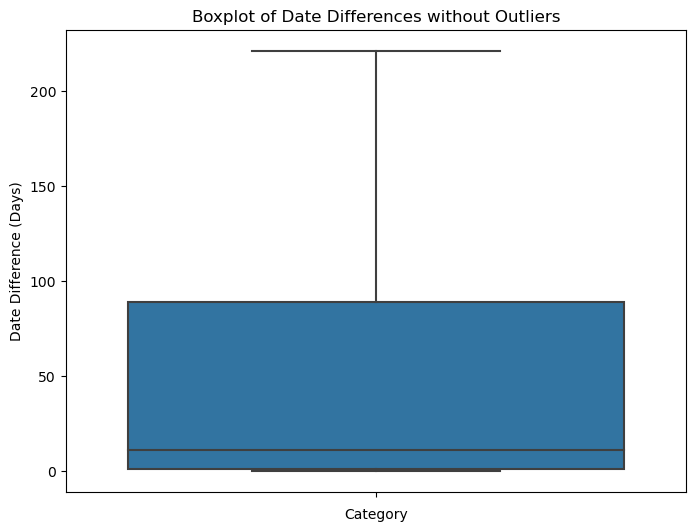

In [128]:
plt.figure(figsize=(8, 6))

sns.boxplot(data=temp, y='Difference from Max to Min', showfliers=False)

plt.xlabel('Category')
plt.ylabel('Date Difference (Days)')
plt.title('Boxplot of Date Differences without Outliers')

plt.show()

/home/sbochman/miniconda3/envs/aml/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


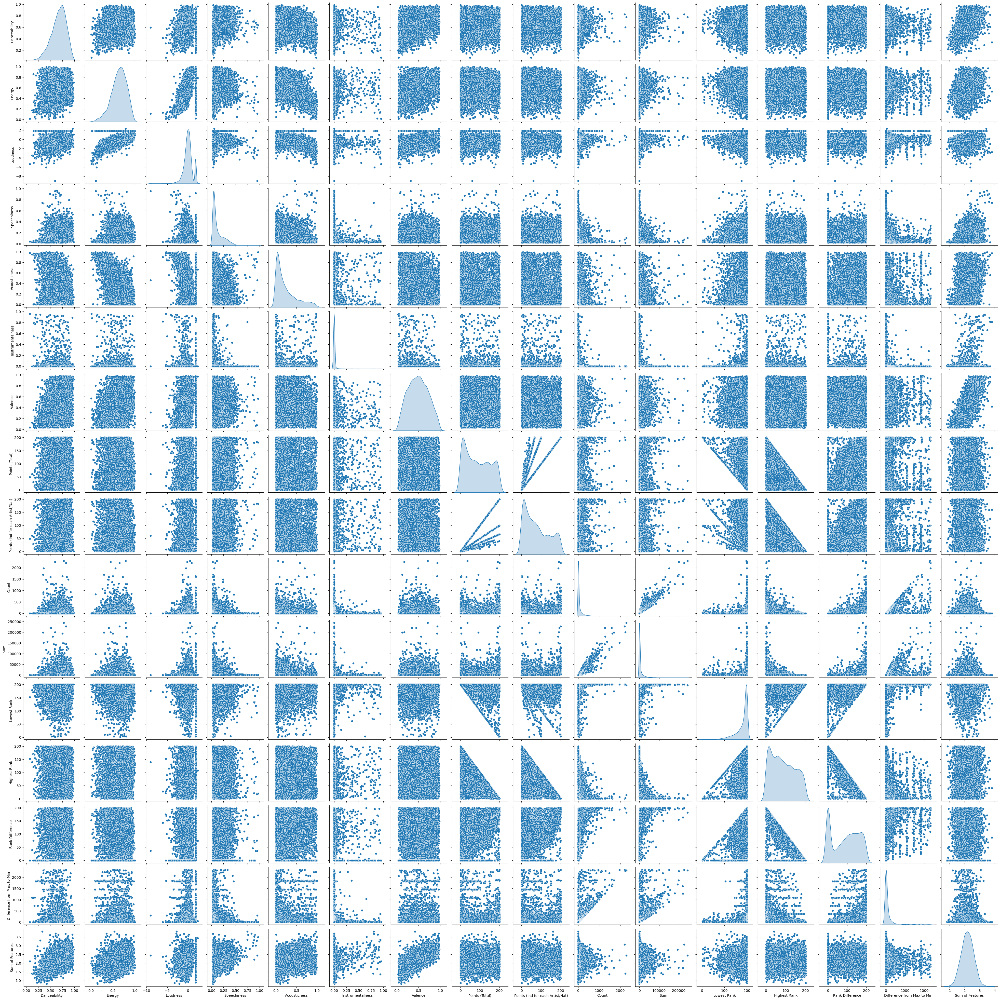

In [129]:
sns.pairplot(temp.iloc[:, 4:], diag_kind='kde')

Text(0.5, 1.0, 'Scatterplot of Sum of Features vs. Date (Grouped by GroupColumn)')

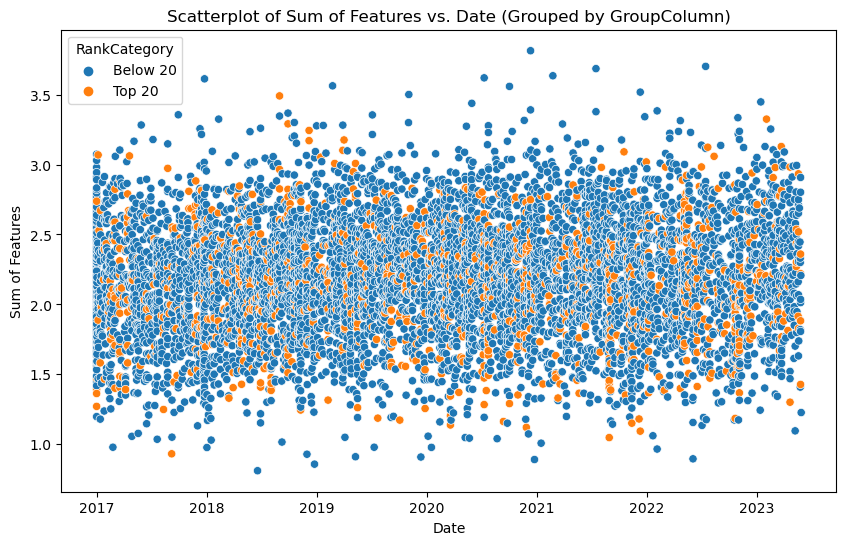

In [134]:
plt.figure(figsize=(10, 6))

sns.scatterplot(data=temp, x="Date", y="Sum of Features", hue="RankCategory")
plt.title("Scatterplot of Sum of Features vs. Date (Grouped by GroupColumn)")
